In [17]:
# in this one

In [18]:
from model.LTA_Stacked_MixedCausality import LTA_Stacked_MixedCausality
from model import load_model
import torch
from hvo_sequence.hvo_seq import HVO_Sequence
from hvo_sequence.drum_mappings import ROLAND_REDUCED_MAPPING
from bokeh.plotting import show, output_notebook
import os
import timeit
from hvo_sequence.hvo_seq import HVO_Sequence

output_notebook()

# mdl_ = 'misc/LTA_Stacked/[srcMasked 30prcnt] [bassGuiSynLead] no in vel_eim5fg3o/870.pth'
mdl_ = 'misc/LTA_Stacked/[srcMasked 30prcnt] [bassGuiSynLead] no in vel_rwxbmr8j/010.pth'
model = load_model(
    model_path=mdl_,
    model_class=LTA_Stacked_MixedCausality,
    device='cpu',
    is_evaluating=True
)

model.serialize(save_folder=os.path.dirname(mdl_), filename=mdl_.split('/')[-1].replace('.pth', '.pt'))
model.eval()

Loading BokehJS ...

StepEncoder: in_features: 20, out_features: 64


/home/dtic/miniconda3/envs/GrooveTransformer/lib/python3.9/site-packages/torch/jit/_recursive.py:313: UserWarning: 'norm' was found in ScriptModule constants,  but it is a non-constant submodule. Consider removing it.
  warnings.warn(


LTA_Stacked_MixedCausality(
  (StepEncoder): StepEncoder(
    (FCN): Sequential(
      (0): Linear(in_features=20, out_features=32, bias=True)
      (1): ReLU()
      (2): Linear(in_features=32, out_features=64, bias=True)
    )
  )
  (PositionalEncoding): PositionalEncoding(
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (TransformerEncoder): TransformerEncoder(
    (layers): ModuleList(
      (0-5): 6 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
        )
        (linear1): Linear(in_features=64, out_features=128, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
        (linear2): Linear(in_features=128, out_features=64, bias=True)
        (norm1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.0, inplace=False)
        (dropout2): Dropout(p=0.

In [19]:
# load data
from data import StackedLTADatasetV2
max_n_bars = 32

# test_datasets:
#   - "data/lmd/data_bass_groove_test.bz2"
#   - "data/lmd/data_guitar_groove_test.bz2"
#   - "data/lmd/data_synth_groove_test.bz2"
#   - "data/lmd/data_lead_groove_test.bz2"
#   - "data/lmd/data_piano_groove_test.bz2"

dataset_dict = {
    'bass': "data/lmd/data_bass_groove_test.bz2",
    'guitar': "data/lmd/data_guitar_groove_test.bz2",
    'synth': "data/lmd/data_synth_groove_test.bz2",
    'lead': "data/lmd/data_lead_groove_test.bz2",
}

#select a random dataset
import random
random_dataset = random.choice(list(dataset_dict.keys()))
print(f"Selected dataset: {random_dataset}")
test_dataset = StackedLTADatasetV2(
        input_inst_dataset_bz2_filepath=dataset_dict[random_dataset],
        output_inst_dataset_bz2_filepath="data/lmd/data_drums_full_unsplit.bz2",
        shift_tgt_by_n_steps=1,
        max_input_bars=max_n_bars,
        hop_n_bars=4,
       input_has_velocity=False,
    start_with_one_bar_of_silent_drums=False)


INFO:data.Base.dataLoaders:StackedLTADatasetV2 Constructor --> Loading Cached Version from: cached/TorchDatasets/StackedLTADatasetV2_for_mixed_causality_data_guitar_groove_test.bz2_data_drums_full_unsplit.bz2_32_4_1.bz2pickle


Selected dataset: guitar


In [20]:
device = 'cpu'





# plot heatmap
import seaborn as sns
import matplotlib.pyplot as plt




def get_hvo_seqs(groove_hvo__, drum_hvo__):
    if len(groove_hvo__.shape) == 3:
        groove_hvo_ = groove_hvo__[0]
    else:
        groove_hvo_ = groove_hvo__

    if len(drum_hvo__.shape) == 3:
        drum_hvo = drum_hvo__[0]
    else:
        drum_hvo = drum_hvo__

    hvo_seq_bass = HVO_Sequence(
        beat_division_factors=[4],
        drum_mapping={'BASS Rhythm': [26]}
    )
    hvo_seq_bass.add_tempo(0, 120)
    hvo_seq_bass.add_time_signature(0, 4, 4)
    hvo_seq_bass.hvo = groove_hvo_.detach().numpy()

    hvo_seq = HVO_Sequence(
        beat_division_factors=[4],
        drum_mapping=ROLAND_REDUCED_MAPPING
    )
    hvo_seq.add_tempo(0, 120)
    hvo_seq.add_time_signature(0, 4, 4)
    hvo_seq.hvo = drum_hvo.detach().numpy()

    audio_bass = hvo_seq_bass.synthesize(sf_path='hvo_sequence/soundfonts/Standard_Drum_Kit.sf2') * 0.5
    audio_drums = hvo_seq.synthesize(sf_path='hvo_sequence/soundfonts/Standard_Drum_Kit.sf2')
    audio_mixed = audio_bass[:min(audio_bass.shape[0], audio_drums.shape[0])] + audio_drums[:min(audio_bass.shape[0], audio_drums.shape[0])]

    return hvo_seq_bass, hvo_seq, audio_bass, audio_drums, audio_mixed


def batch_data_extractor(data_, device=device):
    stacked_target_shifted = data_[0].to(device)
    stacked_target = data_[1].to(device)
    return stacked_target_shifted, stacked_target

def forward_using_batch_data(batch_data, scope_end_step=None, model_=model, device=device):
    model_.train()

    stacked_target_shifted, stacked_target = batch_data_extractor(
        data_=batch_data,
        device=device
    )

    if scope_end_step is not None:
        scope_end_step = min(scope_end_step, stacked_target_shifted.shape[1])
        stacked_target_shifted = stacked_target_shifted[:, :scope_end_step, :]
        stacked_target = stacked_target[:, :scope_end_step, :]

    h_logits, v_logits, o_logits = model_.forward(shifted_tgt=stacked_target_shifted)

    return h_logits, v_logits, o_logits, stacked_target.to(device)


# Auto-regressive prediction
def predict_using_batch_auto_reg(batch_data, model_=model, device='cpu'):
    model_.eval()


    stacked_target_shifted, stacked_target = batch_data_extractor(
        data_=batch_data,
        device=device
    )

    generated = torch.zeros_like(stacked_target)
    generated_shifted = torch.zeros_like(stacked_target_shifted)

    generated_shifted[:, :32, ::10] = stacked_target_shifted[:, :32, ::10] # copy the first bar of bass only
    
    # predict the first two bars (one pass using all 32 steps)
    h_logits, v_logits, o_logits = model_.forward(shifted_tgt=generated_shifted[:, :32, :])
    
    temperature = 1
    
    h_logits = h_logits / temperature
    h = torch.sigmoid(h_logits)
    h[:, :, 0][h[:, :, 0] > 0.8] = 1.0 # bass must be confident -> no stochastic sampling
    h[:, :, 1:3][h[:, :, 1:3] < 0.2] = 0.0    # Kick, snare,
    h[:, :, 3:5][h[:, :, 3:5] < 0.1] = 0.0    # both hh
    h[:, :, 5:9][h[:, :, 5:9] < 0.1] = 0.0    # Toms
    h[:, :, 8][h[:, :, 8] < 0.2] = 0.0    # Crash
    h[:, :, 9:][h[:, :, 9:] < 0.1] = 0.0    # Ride
    
    v = torch.clamp(((torch.tanh(v_logits) + 1.0) / 2), 0.0, 1.0)
    o = torch.tanh(o_logits)
    h[v < 0.02] = 0.0
    h = torch.bernoulli(h)
    v = v * h
    o = o * h
    
    generated[:, :32, :10] = h[:, :32, :]
    generated[:, :32, 10:20] = v[:, :32, :]
    generated[:, :32, 20:] = o[:, :32, :]
    
    generated_shifted[:, 33, :10] = generated[:, 32, :10]
    generated_shifted[:, 33, 10:20] = generated[:, 32, 20:]
    
    
    for bar_start_i in range(32, stacked_target_shifted.shape[1], 16):
        # copy actual groove performed so far
        generated_shifted[:, bar_start_i, ::10] = stacked_target_shifted[:, bar_start_i, ::10] # copy the first bar of bass only

        for i in range(16):
            h_logits, v_logits, o_logits = model_.forward(shifted_tgt=generated_shifted[:, :bar_start_i+i+1, :])

            temperature = 1
            h_logits = h_logits / temperature
            h = torch.sigmoid(h_logits)
            h[:, :, 0][h[:, :, 0] > 0.8] = 1.0 # bass must be confident -> no stochastic sampling
            h[:, :, 1:3][h[:, :, 1:3] < 0.2] = 0.0    # Kick, snare,
            h[:, :, 3:5][h[:, :, 3:5] < 0.1] = 0.0    # both hh
            h[:, :, 5:9][h[:, :, 5:9] < 0.1] = 0.0    # Toms  
            h[:, :, 8][h[:, :, 8] < 0.2] = 0.0    # Crash
            h[:, :, 9:][h[:, :, 9:] < 0.1] = 0.0    # Ride
            
            v = torch.clamp(((torch.tanh(v_logits) + 1.0) / 2), 0.0, 1.0)
            o = torch.tanh(o_logits)
            h[v < 0.02] = 0.0
            h = torch.bernoulli(h)
            v = v * h
            o = o * h

            generated[:, bar_start_i + i, :10] = h[:, bar_start_i + i, :]
            generated[:, bar_start_i + i, 10:20] = v[:, bar_start_i + i, :]
            generated[:, bar_start_i + i, 20:] = o[:, bar_start_i + i, :]

            if i < 15:
                generated_shifted[:, bar_start_i + i + 1, :10] = generated[:, bar_start_i + i, :10]
                generated_shifted[:, bar_start_i + i + 1, 10:20] = generated[:, bar_start_i + i, 20:30]
            
    groove_hvo = generated[:, :, ::10]
    grove_hvo_tgt = stacked_target[:, :, ::10]

    drum_hvo = torch.zeros((generated.shape[0], generated.shape[1], 27))
    drum_hvo[:, :, :9] = generated[:, :, 1:10]
    drum_hvo[:, :, 9:18] = generated[:, :, 11:20]
    drum_hvo[:, :, 18:] = generated[:, :, 21:]

    drum_hvo_tgt = torch.zeros_like(drum_hvo)
    drum_hvo_tgt[:, :, :9] = stacked_target[:, :, 1:10]
    drum_hvo_tgt[:, :, 9:18] = stacked_target[:, :, 11:20]
    drum_hvo_tgt[:, :, 18:] = stacked_target[:, :, 21:]

    return groove_hvo, drum_hvo, grove_hvo_tgt, drum_hvo_tgt


sample_ix = torch.randint(0, len(test_dataset), (1,)).item()
groove_hvo, drum_hvo, grove_hvo_tgt, drum_hvo_tgt = predict_using_batch_auto_reg(test_dataset[sample_ix:sample_ix+1], model_=model, device='cpu')

In [21]:
hvo_seq_bass_tgt, hvo_seq_drum, audio_bass, audio_drums, audio_mixed = get_hvo_seqs(grove_hvo_tgt, drum_hvo)
hvo_seq_bass, hvo_seq_drum, _, _, _ = get_hvo_seqs(groove_hvo, drum_hvo)
hvo_seq_bass_tgt, hvo_seq_drum_tgt, _, _, audio_mixed_tgt = get_hvo_seqs(grove_hvo_tgt, drum_hvo_tgt)

fluidsynth: error: Unknown integer parameter 'synth.sample-rate'
fluidsynth: error: Unknown integer parameter 'synth.sample-rate'
fluidsynth: error: Unknown integer parameter 'synth.sample-rate'
fluidsynth: error: Unknown integer parameter 'synth.sample-rate'
fluidsynth: error: Unknown integer parameter 'synth.sample-rate'
fluidsynth: error: Unknown integer parameter 'synth.sample-rate'


In [22]:
from IPython.display import Audio, display
print("---------------------------------")
print(f"Generated from")
print("---------------------------------")
display(Audio(audio_mixed, rate=44100))
hvo_seq_bass_tgt.to_html_plot(show_figure=True, width=1400, height=130, filename='misc/GrooveOriginal.html')

---------------------------------
Generated from
---------------------------------


Figure(id='4979', ...)

In [23]:
hvo_seq_bass.to_html_plot(show_figure=True, width=1400, height=130, filename='misc/GroovePredicted.html')


Figure(id='5819', ...)

In [24]:
hvo_seq_drum.to_html_plot(show_figure=True, width=1400, height=200)

Figure(id='6674', ...)

In [25]:
print("------------------"
      "\---------------")
print("Target")
print("---------------------------------")
display(Audio(audio_mixed_tgt, rate=44100))
hvo_seq_bass_tgt.to_html_plot(show_figure=True, width=1400, height=200)

------------------\---------------
Target
---------------------------------


Figure(id='7544', ...)

In [26]:
hvo_seq_drum_tgt.to_html_plot(show_figure=True, width=1400, height=200)

Figure(id='8429', ...)

In [27]:
def patch_attention(m):
    forward_orig = m.forward

    def wrap(*args, **kwargs):
        kwargs['need_weights'] = True
        kwargs['average_attn_weights'] = False

        return forward_orig(*args, **kwargs)

    m.forward = wrap

class SaveOutput:
    def __init__(self):
        self.outputs = []

    def __call__(self, module, module_in, module_out):
        self.outputs.append(module_out[1])

    def clear(self):
        self.outputs = []
        
save_output = SaveOutput()

layer_ix = 0

patch_attention(model.TransformerEncoder.layers[layer_ix].self_attn)
hook_handle = model.TransformerEncoder.layers[layer_ix].self_attn.register_forward_hook(save_output)

groove_hvo, drum_hvo, grove_hvo_tgt, drum_hvo_tgt = predict_using_batch_auto_reg(test_dataset[sample_ix:sample_ix+1], model_=model, device='cpu')
save_output.outputs

[tensor([[[[0.0184, 0.0154, 0.0171,  ..., 0.0302, 0.0321, 0.0258],
           [0.0189, 0.0170, 0.0200,  ..., 0.0262, 0.0293, 0.0235],
           [0.0194, 0.0181, 0.0212,  ..., 0.0241, 0.0282, 0.0233],
           ...,
           [0.0197, 0.0145, 0.0129,  ..., 0.0399, 0.0402, 0.0377],
           [0.0215, 0.0162, 0.0139,  ..., 0.0398, 0.0397, 0.0398],
           [0.0235, 0.0180, 0.0153,  ..., 0.0409, 0.0416, 0.0425]],
 
          [[0.0313, 0.0358, 0.0411,  ..., 0.0415, 0.0448, 0.0417],
           [0.0268, 0.0314, 0.0375,  ..., 0.0392, 0.0411, 0.0370],
           [0.0222, 0.0270, 0.0339,  ..., 0.0354, 0.0373, 0.0339],
           ...,
           [0.0167, 0.0231, 0.0306,  ..., 0.0426, 0.0411, 0.0375],
           [0.0210, 0.0271, 0.0341,  ..., 0.0449, 0.0505, 0.0486],
           [0.0257, 0.0313, 0.0373,  ..., 0.0479, 0.0562, 0.0551]],
 
          [[0.0331, 0.0288, 0.0253,  ..., 0.0534, 0.0784, 0.0838],
           [0.0380, 0.0347, 0.0308,  ..., 0.0539, 0.0813, 0.0892],
           [0.0426, 0.04

DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.AutoLocator object at 0x7f2ec0147b20>


torch.Size([1, 4, 512, 512])


DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.AutoLocator object at 0x7f2ec00669d0>
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.AutoLocator object at 0x7f2ebbf900a0>
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.AutoLocator object at 0x7f2ebbecf640>


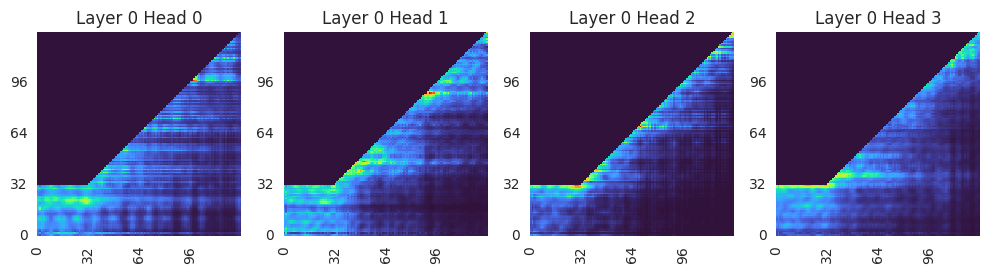

In [33]:
def plot_head_n_attention(attn_weights_list,  binary_vis=False, x_zoom_range=None, y_zoom_range=None):
    attn_weights = attn_weights_list[0] if isinstance(attn_weights_list, list) else attn_weights_list

    print(attn_weights.shape)

    attn_weights_0 = attn_weights.detach().cpu().numpy()


    if binary_vis:
        attn_weights_0 = attn_weights_0 > 0.01


    # two side by side plots
    fig, ax = plt.subplots(1, 4, figsize=(10, 5))

    # use a greyscale color map (Spectral)


    # put ticks on 0, 4, ...
    # rotate y ticks
    if x_zoom_range is None:
        x_zoom_range = [0, attn_weights_0.shape[2]]
    
    if y_zoom_range is None:
        y_zoom_range = [0, attn_weights_0.shape[3]]
        
    for i, a in enumerate(ax):
        sns.heatmap(attn_weights_0[0, i, x_zoom_range[0]:x_zoom_range[1], y_zoom_range[0]:y_zoom_range[1]].transpose(), cmap='turbo', ax=a)
        ax[i].set_title(f'Layer {layer_ix} Head {i}')
        a.set_xticks([i for i in range(x_zoom_range[0], x_zoom_range[1], 32)])
        a.set_xticklabels([i for i in range(x_zoom_range[0], x_zoom_range[1], 32)])
        a.set_yticks([i for i in range(y_zoom_range[0], y_zoom_range[1], 32)])
        a.set_yticklabels([i for i in range(y_zoom_range[0], y_zoom_range[1], 32)])
        a.set_yticklabels(a.get_yticklabels(), rotation=0)
        # don't show color bar
        a.collections[0].colorbar.remove()
        # tighten layout
        plt.tight_layout()



    # flip y axis
    for a in ax:
        a.invert_yaxis()

    # ensure same aspect ratio
    for a in ax:
        a.set_aspect('equal')

    plt.show()

plot_head_n_attention(save_output.outputs[-1], x_zoom_range=[0, 128], y_zoom_range=[0, 128], binary_vis=False)
# plot_head_n_attention(save_output.outputs[-1], x_zoom_range=None, y_zoom_range=None, binary_vis=False)

In [29]:
model.TransformerEncoder.layers[0].self_attn

MultiheadAttention(
  (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
)

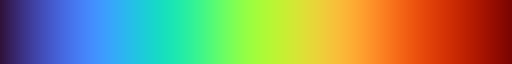

In [30]:
# show 10 different color palettes
sns.color_palette("Spectral", as_cmap=True)
sns.color_palette("coolwarm", as_cmap=True)
sns.color_palette("viridis", as_cmap=True)
sns.color_palette("cividis", as_cmap=True)
sns.color_palette("magma", as_cmap=True)
sns.color_palette("inferno", as_cmap=True)
sns.color_palette("plasma", as_cmap=True)
sns.color_palette("twilight", as_cmap=True)
sns.color_palette("twilight_shifted", as_cmap=True)
sns.color_palette("turbo", as_cmap=True)


In [31]:
# # alternative positional embedding
#
# import numpy as np
#
# def modified_positional_encoding(period, d_model, max_len=512):
#     pe = np.zeros((max_len, d_model))
#     position = np.arange(0, max_len).reshape(-1, 1)
#
#     # Sinusoidal part
#     div_term = 2 * np.pi / period
#     pe[:, 0::2] = np.sin(position * div_term)
#     pe[:, 1::2] = np.cos(position * div_term)
#
#     # Linear term for distinguishability
#     div_term_linear = 10000 ** (np.arange(0, d_model) / d_model)
#     pe += position / div_term_linear
#
#     return pe
#
# def normal_positional_encoding(d_model, max_len=512):
#     pe = np.zeros((max_len, d_model))
#     position = np.arange(0, max_len).reshape(-1, 1)
#
#     # Sinusoidal part
#     div_term = 10000 ** (np.arange(0, d_model, 2) / d_model)
#     pe[:, 0::2] = np.sin(position / div_term)
#     pe[:, 1::2] = np.cos(position / div_term)
#
#     return pe
#
# # Example usage:
# period = 16  # For example, if the period is 24
# d_model = 16
# pos_enc_periodic = modified_positional_encoding(period, d_model)
# pos_enc_normal = normal_positional_encoding(d_model)
#
# # To use this positional encoding in a transformer model
# import torch
# pos_enc_tensor_periodic = torch.tensor(pos_enc_periodic, dtype=torch.float32)
# pos_enc_tensor_normal = torch.tensor(pos_enc_normal, dtype=torch.float32)
#
#
#
# # visualize similar to attention is all you need paper
# # show both
# import seaborn as sns
# import matplotlib.pyplot as plt
#
# fig, ax = plt.subplots(1, 2, figsize=(20, 5))
#
# # use a greyscale color map
# sns.heatmap(pos_enc_tensor_periodic, cmap='Greys', ax=ax[0])
# ax[0].set_title('Modified Positional Encoding')
#
# sns.heatmap(pos_enc_tensor_normal, cmap='Greys', ax=ax[1])
# ax[1].set_title('Normal Positional Encoding')
#
# plt.show()


In [32]:
# find nans in the output
outs = save_output.outputs[-1]

print(torch.isnan(outs).any())



tensor(False)
